<a href="https://colab.research.google.com/github/michaeldouglas/mba_IA_ML-proj_int-grupo_b/blob/main/Python/trabalho-titanic-fiap/Trabalho_Modelos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install ipywidgets

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.6 MB 10.1 MB/s 


In [2]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     \ 22.0 MB 167 kB/s
     |████████████████████████████████| 102 kB 7.6 MB/s 
     |████████████████████████████████| 690 kB 44.3 MB/s 
     |████████████████████████████████| 4.7 MB 41.4 MB/s 
     |████████████████████████████████| 62 kB 1.2 MB/s 
     |████████████████████████████████| 9.8 MB 46.2 MB/s 
     |████████████████████████████████| 296 kB 51.4 MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-3.3.1-py2.py3-none-any.whl size=310107 sha256=3cf59fff949ebd596bb5689ff3c88832daafb341440f07b623199fcca02e2e83
  Stored in directory: /tmp/pip-ephem-wheel-cache-3q57vtim/wheels/cc/d5/09/083fb07c9363a2f45854b0e3a7de7d7c560f07da74b9e9769d
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=cf2f7429d619c2cb63fb17da72c14c2015bb37d065716a700d5e564f671cb74b
  Stored in directory: /root/.cache/pip/wheels/70/e1/52/5b14d250ba868768823940

In [3]:
!pip install pyjanitor

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 147 kB 7.3 MB/s 


In [4]:
!pip install mlxtend

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [5]:
!pip install six

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# Sobre o trabalho

Prezad@s, conforme conversamos na aula do dia 21/09, vocês apresentarão o trabalho final da disciplina na última aula (dia 14/10). A data de upload do trabalho no portal é até dia 14/10 as 19:00 (horário de Brasília)
Cada grupo terá 20 minutos para apresentação, fiquem atentos ao tempo (para não ir rápido demais e nem passar do tempo. 
Entregáveis (zip contendo): 
1-	Código da implementação explicado/comentado o mais detalhado possível
2-	PPT da apresentação

Apresentação: 
1 - apresentação de um problema real que pode ser resolvido com modelo supervisionado (2 slides: tipo do problema, modelo/técnica que resolveria)
2 - apresentação de um problema real que pode ser resolvido com modelo não supervisionado ou técnica de IA (2 slides: tipo do problema, modelo/técnica que resolveria)
3 - apresentar um problema real que não precisa de machine learning para resolver (1 slide)
4 – Apresentar o problema “implementado”, que pode ser:
Escolher um artigo científico, que usou algum tipo modelo/técnica que foi visto na disciplina para resolver um determinando problema (pode ser qual problema). De preferência em escolher um que tenha implementação pública.
ou
Escolher um problema de alguma competição (ex. Kaggle), que usou algum tipo modelo/técnica que foi visto na disciplina (pode ser qual problema). De preferência em escolher um que tenha implementação pública.
ou
Escolher qualquer problema que o grupo queria (da empresa que trabalha, do kaggle, do startupone, etc) e criar uma aplicação com machine learning.

Links úteis:
https://paperswithcode.com/
https://www.kaggle.com/
https://arxiv.org/
https://scholar.google.com/

## Dataset Titanic

Para o nosso exemplo escolhemos o conjunto de dados do Titanic que é um problema comum de classificação, onde desejamos classificar se um indivíduo sobrebibeu à catástrofe do navio Titanic com base nas características individuais e da viagem.

Nosso modelo deverá ser capaz de prever se um passageiro sobrebibeu ao Titanic a partir das informações sobre esse passageiro.

Responderemos uma pergunta de classificação, pois faremos uma predição de um rótulo (label) acerva da sobrevivência de uma passageiro, a partir disso seremos capazes de responder se ele consegiu viver ou morreu na tragédia.

Desafio: https://www.kaggle.com/c/titanic/data

### Bibliotecas utilizadas

*   Pandas - Manipulação dos dados
*   Sickit-learn - modelagem preditiva
*   Yellowbrick - visuliazação e avaliação de modelos



In [6]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn import (
    ensemble,
    preprocessing,
    tree
)
from sklearn.metrics import (
    auc,
    confusion_matrix,
    roc_auc_score,
    roc_curve
)
from sklearn.model_selection import (
    train_test_split,
    StratifiedKFold
)
from yellowbrick.classifier import (
    ConfusionMatrix,
    ROCAUC
)
from yellowbrick.model_selection import (
    LearningCurve
)

### Importação da base

Importamos a nossa base **titanic.csv** que contém as seguintes colunas:

*   pclass: Classe do passageiro (1 = primeira, 2 = segunda, 3 = terceira)
*   survived: sobreviveu (0 = não, 1 = sim)
*   name: Nome do passageiro
*   sex: Sexo do passageiro
*   age: Idade do passageiro
*   sibsp: Número de irmãos/espaosa(o) a bordo com o passageiro
*   parch: Número de pais/filhos a bordo com o passageiro
*   ticket: Número da passagem
*   fare: Preço da passagem
*   cabin: cabine
*   embarked: (Local em que o passageiro embarcou:
    *   C = Cherbourg
    *   Q = QUeenstown
    *   S = Southamption
*   boat: Bote salva-vidas
*   body: Número de identificação do corp
*   home.dest: Onde o passageiro morava e o destino que estava indo.


In [7]:
titanic_df = pd.read_csv("titanic.csv", sep=",")
original_df = titanic_df
titanic_df.head()

,pclass,survived,name,sex,age,sibsp,parch,ticket,fare,cabin,embarked,boat,body,home.dest
0,1,1,"Allen, Miss. Elisabeth Walton",female,29.0000,0,0,24160,211.3375,B5,S,2,NaN,"St Louis, MO"
1,1,1,"Allison, Master. Hudson Trevor",male,0.9167,1,2,113781,151.5500,C22 C26,S,11,NaN,"Montreal, PQ / Chesterville, ON"
2,1,0,"Allison, Miss. Helen Loraine",female,2.0000,1,2,113781,151.5500,C22 C26,S,NaN,NaN,"Montreal, PQ / Chesterville, ON"
3,1,0,"Allison, Mr. Hudson Joshua Creighton",male,30.0000,1,2,113781,151.5500,C22 C26,S,NaN,135.0,"Montreal, PQ / Chesterville, ON"
4,1,0,"Allison, Mrs. Hudson J C (Bessie Waldo Daniels)",female,25.0000,1,2,113781,151.5500,C22 C26,S,NaN,NaN,"Montreal, PQ / Chesterville, ON"


### Limpeza dos dados

Antes da limpeza verificamos os dados do nosso modelo:

In [8]:
titanic_df.dtypes

pclass         int64
survived       int64
name          object
sex           object
age          float64
sibsp          int64
parch          int64
ticket        object
fare         float64
cabin         object
embarked      object
boat          object
body         float64
home.dest     object
dtype: object

A seguir utilizamos o pandas_profiling que irá sintetizar os tipos das colunas e permite que sejamos capazes se visualizar os detalhes estatísticas dos quantis, as estatísticas descritivas, um histograma os o valoes comuns.

In [9]:
from pandas_profiling import ProfileReport

In [10]:
# Número de linhas e colunas
titanic_df.shape

(1309, 14)

In [11]:
profile = ProfileReport(titanic_df, title='Titanic', html={'style':{'full_width':True}})

In [12]:
profile.to_widgets()

/usr/local/lib/python3.7/dist-packages/pandas_profiling/profile_report.py:426: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  "Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60)."


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [13]:
profile.to_notebook_iframe()

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Verificação de dados nulos

Aqui nós vamos verificar os dados nulos do nosso modelo, além disso colocamos o resultado em um DataFrame para exibir o total encontrado X a proporção de valores nulos do nosso modelo.

In [14]:
titanic_df.isnull().mean(axis=1).loc[:10]

0     0.071429
1     0.071429
2     0.142857
3     0.071429
4     0.142857
5     0.071429
6     0.071429
7     0.142857
8     0.071429
9     0.142857
10    0.071429
dtype: float64

In [15]:
titanic_df.isnull() # Aqui verificamos o total de null na base se existir
titanic_df.isnull().sum()/len(titanic_df) # Aqui obtemos a proporção de null se existir

# Criamos um novo DataFrame para verificar o total e a proporção de null na base
pd.DataFrame(zip(titanic_df.isnull().sum(),titanic_df.isnull().sum()/len(titanic_df)), columns=['Count', 'Proportion'], index=titanic_df.columns)

,Count,Proportion
pclass,0,0.000000
survived,0,0.000000
name,0,0.000000
sex,0,0.000000
age,263,0.200917
sibsp,0,0.000000
parch,0,0.000000
ticket,0,0.000000
fare,1,0.000764
cabin,1014,0.774637


Nós percebemos que existem alguns valores nulos em nosso dataset, mas posteriormente resolveremos isso.

### Aqui realizamos uma análise descritiva dos dados e arredondamos o valor com 2 casas decimais.

Após essa análise conseguimos chegar a algumas percepções dos dados:

*   A média de sobrevivencia é de: **0.38**
*   O desvio padrão é de: **0.49**
*   O menor valor é de: **0.00**
*   Meu percentil de 25% na base é de: **0.0**
*   Meu percentil de 50% na base de salários é de: **0.00**
*   Meu percentil de 75% na base de salários é de: **1.00**
*   O maior valor da base é de: **1.00**

Nesta primeira análise já conseguimos verificar que algumas variáveis provavelmente irão influciar no nosso modelo, pois estão bem correlacionadas:

*   pclass
*   fare
*   survived 
*   sex 
*   boat 
*   embarked

Nossa intenção era verificar as variáveis:

*   pclass
*   survived
*   sex - Aqui não foi possível pois é uma variável não númerica

Para responder de forma genérica a dúvida:

A partir da classe do passageiro e sexo ele sobreviveu?





In [16]:
titanic_df.describe().iloc[:, [0,1]]

,pclass,survived
count,1309.000000,1309.000000
mean,2.294882,0.381971
std,0.837836,0.486055
min,1.000000,0.000000
25%,2.000000,0.000000
50%,3.000000,0.000000
75%,3.000000,1.000000
max,3.000000,1.000000


In [17]:
titanic_df.describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
pclass,1309.0,2.29,0.84,1.00,2.0,3.00,3.00,3.00
survived,1309.0,0.38,0.49,0.00,0.0,0.00,1.00,1.00
age,1046.0,29.88,14.41,0.17,21.0,28.00,39.00,80.00
sibsp,1309.0,0.50,1.04,0.00,0.0,0.00,1.00,8.00
parch,1309.0,0.39,0.87,0.00,0.0,0.00,0.00,9.00
fare,1308.0,33.30,51.76,0.00,7.9,14.45,31.28,512.33
body,121.0,160.81,97.70,1.00,72.0,155.00,256.00,328.00


# Remoção da coluna body

Verificamos que a coluna body (número de identificação do corpo) está ausente em muitas linhas, sendo assim resolvemos descartar essa coluna, de qualquer modo, pois ela causa vazamento de informação e com isso nosso modelo poderia usar esse dado para trapacear e acabar respondendo errado.

Como nós queremos prever se o passageiro morreu, saber que ele teve um número de identificação de corpo nos levaria a saber, a priori, que ele morreu.

De modo semelhante, a coluna boat(bote salva-vidas) causa vazamento de inoformação inversa nesse caso já diria que o passageiro sobreviveu.

In [18]:
mask = titanic_df.isnull().any(axis=1)

mask.head()

0    True
1    True
2    True
3    True
4    True
dtype: bool

In [19]:
titanic_df[mask].body.head()

0      NaN
1      NaN
2      NaN
3    135.0
4      NaN
Name: body, dtype: float64

### Colunas do tipo object

Reparemos que temos algumas colunas no tipo object que contem valores de categorias, vamos executar o método .value_counts para analisar os contadores dos valores nas colunas:

*   sex
*   embarked

Não faremos nas outras colunas object porque o nosso foco estava nessas variáveis.



In [20]:
titanic_df.dtypes

pclass         int64
survived       int64
name          object
sex           object
age          float64
sibsp          int64
parch          int64
ticket        object
fare         float64
cabin         object
embarked      object
boat          object
body         float64
home.dest     object
dtype: object

In [21]:
titanic_df['sex'].value_counts(dropna=False)

male      843
female    466
Name: sex, dtype: int64

In [22]:
titanic_df['embarked'].value_counts(dropna=False)

S      914
C      270
Q      123
NaN      2
Name: embarked, dtype: int64

Reparemos que existem alguns valores Nan em `embarked`, porém trataremos isso no futuro.

### Criação de atributos

Nós decidimos descartar as colunas que não terão variação para o nosso modelo. Um exemplo é a coluna nome (name) e além disso também descartamos para que não ocorra vazamento de informação acerca de o passageiro ter sobrevivido ou não.

In [23]:
name = titanic_df['name']

name.head()

0                      Allen, Miss. Elisabeth Walton
1                     Allison, Master. Hudson Trevor
2                       Allison, Miss. Helen Loraine
3               Allison, Mr. Hudson Joshua Creighton
4    Allison, Mrs. Hudson J C (Bessie Waldo Daniels)
Name: name, dtype: object

In [24]:
titanic_df = titanic_df.drop(columns=[
    "name",
    "ticket",
    "home.dest",
    "boat",
    "body",
    "cabin"
])

In [25]:
titanic_df.head()

,pclass,survived,sex,age,sibsp,parch,fare,embarked
0,1,1,female,29.0000,0,0,211.3375,S
1,1,1,male,0.9167,1,2,151.5500,S
2,1,0,female,2.0000,1,2,151.5500,S
3,1,0,male,30.0000,1,2,151.5500,S
4,1,0,female,25.0000,1,2,151.5500,S


Reparemos aqui que existe algumas variáveis categoricas e isso pode ser ruim para o nosso modelo. Por este motivo criaremos variáveis dummies para essas colunas e assim transformaremos elas em númericas.

In [26]:
titanic_df = pd.get_dummies(titanic_df)

Aqui podemos ver que o Pandas gerou novas colunas que usaremos no futuro em nosso modelo.

In [27]:
titanic_df.columns

Index(['pclass', 'survived', 'age', 'sibsp', 'parch', 'fare', 'sex_female',
       'sex_male', 'embarked_C', 'embarked_Q', 'embarked_S'],
      dtype='object')

In [28]:
titanic_df.head()

,pclass,survived,age,sibsp,parch,fare,sex_female,sex_male,embarked_C,embarked_Q,embarked_S
0,1,1,29.0000,0,0,211.3375,1,0,0,0,1
1,1,1,0.9167,1,2,151.5500,0,1,0,0,1
2,1,0,2.0000,1,2,151.5500,1,0,0,0,1
3,1,0,30.0000,1,2,151.5500,0,1,0,0,1
4,1,0,25.0000,1,2,151.5500,1,0,0,0,1


### Remoção de colunas

Reparemos que as colunas sex_male e sex_female estão inversamento correlacionadas, sendo assim removeremos para não termos problema de multicolinearidade que pode causa impactos na interpretação da importância dos nossos atributos.

In [29]:
titanic_df = titanic_df.drop(columns="sex_male")

In [30]:
titanic_df = pd.get_dummies(titanic_df, drop_first=True)

In [31]:
titanic_df.columns

Index(['pclass', 'survived', 'age', 'sibsp', 'parch', 'fare', 'sex_female',
       'embarked_C', 'embarked_Q', 'embarked_S'],
      dtype='object')

### Criação do DataFrame

Criaremos então um série (y) com os rótulos. Faremos isso para na sequência executar o treino e teste. Como a variável target é survived nós a removeremos.

In [32]:
import janitor as jn

X, y = jn.ml.get_features_targets(titanic_df, target_columns="survived")

### Separação da amostra

Usaremos o scikit-learn para extrar 30% dos dados para testes. Usamos random_state 42 para eliminar a aleatoriedade, pois queremos comprar diferentes modelos.

In [33]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

### Imputação de dados

Reparemos que a coluna idade tem valores ausentes. Decidimos então imputar dados aos valores ausentes no conjunto de trinamento e usar os imputers treinados para preencher o conjunto de dados de testes.

In [34]:
from sklearn.experimental import (
    enable_iterative_imputer
)
from sklearn import impute
num_cols = [
    "pclass",
    "age",
    "sibsp",
    "parch",
    "fare",
    "sex_female"
]

In [35]:
imputer = impute.IterativeImputer()
imputed = imputer.fit_transform(
    X_train[num_cols]
)

In [36]:
X_train.loc[:, num_cols] = imputed
imputed = imputer.transform(X_test[num_cols])
X_test.loc[:, num_cols] = imputed

In [37]:
meds = X_train.median()
X_train = X_train.fillna(meds)
X_test = X_test.fillna(meds)

### Normalização dos dados

Resolvemos padronizar os dados para o pré-processamento afim de patronizar os dados, ou seja, traduzir os dados de modo que tenham um valor de média igual a zero e um desvio-padrão igual a um. Desse modo, os modelos não trarão as variáveis com escalas maiores como mais importantes.

In [38]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)
X_train = pd.DataFrame(X_train)

X_test = scaler.transform(X_test)
X_test = pd.DataFrame(X_test)

In [39]:
X_train.head()

,0,1,2,3,4,5,6,7,8
0,0.825248,-0.128878,-0.498616,-0.432553,-0.473599,-0.739795,-0.506474,-0.330089,0.660104
1,0.825248,-0.205639,-0.498616,-0.432553,-0.488120,-0.739795,-0.506474,-0.330089,0.660104
2,-0.363317,-0.751431,-0.498616,-0.432553,-0.145224,1.351725,-0.506474,-0.330089,0.660104
3,0.825248,-2.198733,6.897852,1.805972,0.679618,1.351725,-0.506474,-0.330089,0.660104
4,0.825248,-0.049698,-0.498616,-0.432553,-0.490408,1.351725,-0.506474,-0.330089,0.660104


In [40]:
X_test.head()

,0,1,2,3,4,5,6,7,8
0,0.825248,0.496095,-0.498616,-0.432553,-0.502719,-0.739795,-0.506474,-0.330089,0.660104
1,0.825248,-0.673461,0.425943,0.686709,-0.339518,-0.739795,1.974436,-0.330089,-1.514914
2,0.825248,-0.128452,-0.498616,-0.432553,-0.488120,-0.739795,-0.506474,-0.330089,0.660104
3,0.825248,-0.128538,-0.498616,-0.432553,-0.485199,-0.739795,-0.506474,-0.330089,0.660104
4,0.825248,-0.128371,-0.498616,-0.432553,-0.490881,-0.739795,-0.506474,3.029485,-1.514914


# Criação das funções para execução do nosso modelo

Agora que já realizamos as análises necessárias resolvemos criar algumas funções para utilizar no futuro e facilitar o nosso trabalho.

In [41]:
# Função para obter os dados necessários e também retornar as variáveis dummies 
# para valores categoricos

def adjust_titanic_data(df):
  df = df.drop(columns=[
      "name",
      "ticket",
      "home.dest",
      "boat",
      "body",
      "cabin",
  ]).pipe(pd.get_dummies, drop_first=True)

  return df

In [42]:
# Função de treino e teste para o nosso modelo

from sklearn import model_selection
def get_train_test_X_y(df, y_col, size=0.3, std_cols=None):
  y = df[y_col]
  X = df.drop(columns=y_col)
  X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=size, random_state=42)
  cols = X.columns
  num_cols = [
      "pclass",
      "age",
      "sibsp",
      "parch",
      "fare",
      ]
  fi = impute.IterativeImputer()
  X_train.loc[:, num_cols] = fi.fit_transform(X_train[num_cols])
  X_test.loc[:, num_cols] = fi.transform(X_test[num_cols])

  if std_cols:
    std = preprocessing.StandardScaler()
    X_train.loc[:, std_cols] = std.fit_transform(X_train[std_cols])

    X_test.loc[:, std_cols] = std.transform(X_test[std_cols])
  
  return X_train, X_test, y_train, y_test

In [43]:
original_df.head()

,pclass,survived,name,sex,age,sibsp,parch,ticket,fare,cabin,embarked,boat,body,home.dest
0,1,1,"Allen, Miss. Elisabeth Walton",female,29.0000,0,0,24160,211.3375,B5,S,2,NaN,"St Louis, MO"
1,1,1,"Allison, Master. Hudson Trevor",male,0.9167,1,2,113781,151.5500,C22 C26,S,11,NaN,"Montreal, PQ / Chesterville, ON"
2,1,0,"Allison, Miss. Helen Loraine",female,2.0000,1,2,113781,151.5500,C22 C26,S,NaN,NaN,"Montreal, PQ / Chesterville, ON"
3,1,0,"Allison, Mr. Hudson Joshua Creighton",male,30.0000,1,2,113781,151.5500,C22 C26,S,NaN,135.0,"Montreal, PQ / Chesterville, ON"
4,1,0,"Allison, Mrs. Hudson J C (Bessie Waldo Daniels)",female,25.0000,1,2,113781,151.5500,C22 C26,S,NaN,NaN,"Montreal, PQ / Chesterville, ON"


In [44]:
# Aqui nós obtemos os dados necessários do DataFrame original
ti_df = adjust_titanic_data(original_df)

# As colunas que precisamos revisar
std_cols = "pclass,age,sibsp,fare".split(",")

# Execução do teste e treino para o nosso modelo
X_train, X_test, y_train, y_test = get_train_test_X_y(
    ti_df, "survived", std_cols=std_cols
)

### Score da base

Antes de escolhermos um modelo nós vamos verificar o `.score` da nossa base. Aqui ainda não escolhemos um algoritmo de modelo, apenas vamos verificar o score (pontuação) que a nossa base está dando para o teste X treino, ou seja, é para vermos o qual preciso está esse teste com o treino, porém sabemos que isso nós da uma precisão eganosa.

O problema é que um caso positivo seja de 1 em 10 mil poderia facilmente ter uma precisão acima de 99% ao fazer uma predição negativa e sendo assim poderia prever erroneamente a morte de um passageiro.

In [45]:
from sklearn.dummy import DummyClassifier

bm = DummyClassifier()

bm.fit(X_train, y_train)
result = bm.score(X_test, y_test) # Verificamos aqui a precisão entre X_test e y_test

f'A precisão atual é de: {result*100:.2f}%'

'A precisão atual é de: 57.00%'

### Score da predição

Agora nós realizaremos um teste de `score` para medir a predição da nossa base. Aqui não usamos ainda um algoritmo pois escolheremos um no futuro, apenas verificamos como está a pontuação de predição da nossa base.

In [46]:
from sklearn import metrics

result = metrics.f1_score(y_test, bm.predict(X_test), average='weighted')

f'A precisão de predição é de: {result*100:.2f}%'

'A precisão de predição é de: 41.39%'

## Escolha do modelo

Agora que já realizamos diversas análises em nossa base resolvemos então realizar o teste de uma família de altoritmos para que possamos então escolher um algoritmo mais adequado para a predissão do dataframe Titanic.

Para o nosso teste usaremos algumas famílias diferentes e comparamos a pontuação dos algoritmos utilizando a técnica AUC (O AUC representa o grau ou medida de separabilidade. Quanto maior o AUC, melhor o modelo está em prever 0s como 0s e 1s como 1s.). Além disso retornamos o teste de desvio-padrão, usando uma validação cruzada do tipo k-fold, para determinar o melhor algoritmo.

In [47]:
X = pd.concat([X_train, X_test]) # Concatenamos os X de treino com o teste
y = pd.concat([y_train, y_test]) # Concatenamos os Y de treino com o teste

In [48]:
# Teste de seleção de modelo
from sklearn import model_selection

# Importação dos algoritmos
from sklearn.dummy import DummyClassifier # Algotirmo de classificação fictício
from sklearn.linear_model import (LogisticRegression) # Algotirmo de regressão logística
from sklearn.tree import DecisionTreeClassifier # Algoritmo de árvore de decisão
from sklearn.neighbors import (KNeighborsClassifier) # Algoritmo classificador de vizinhos K
from sklearn.naive_bayes import GaussianNB # Algoritmo de Classificação Naive Bayes
from sklearn.svm import SVC # Algoritmo de classificação de vetores de suporte
from sklearn.ensemble import (RandomForestClassifier) # Algoritmo de floresta aleatória
import xgboost # Algoritmo Xgboost

In [49]:
for model in [
    DummyClassifier,
    LogisticRegression,
    DecisionTreeClassifier,
    KNeighborsClassifier,
    GaussianNB,
    SVC,
    RandomForestClassifier,
    xgboost.XGBClassifier,
]:
    cls = model()
    kfold = model_selection.KFold(
        n_splits=10, random_state=42, shuffle=True
    )
    s = model_selection.cross_val_score(
        cls, X, y, scoring="roc_auc", cv=kfold
    )
    print(
        f"{model.__name__:22}  AUC: "
        f"{s.mean():.2f} STD: {s.std():.2f}"
    )

DummyClassifier         AUC: 0.50 STD: 0.00
LogisticRegression      AUC: 0.84 STD: 0.04
DecisionTreeClassifier  AUC: 0.76 STD: 0.03
KNeighborsClassifier    AUC: 0.83 STD: 0.02
GaussianNB              AUC: 0.81 STD: 0.05
SVC                     AUC: 0.84 STD: 0.03
RandomForestClassifier  AUC: 0.85 STD: 0.02
XGBClassifier           AUC: 0.86 STD: 0.03


Em nossa análise o algoritmo que teve um bom desempenho é: **RandomForestClassifier**, porém sabemos que isso é apenas um teste que pode ajudar na decisão e não de que realmente esse é o melhor algoritmo. Reparamos que o algoritmo **XGBClassifier** tem uma pontuação AUC maior, porém o desvio padrão está maior, sendo assim, ao que tudo indica o melhor algoritmo é o: **RandomForestClassifier**

A seguir nós executamos um segundo teste chamado stacking, o classificador stacking utiliza a saída de outros modelos para fazer a predição de um objetivo ou de um rótulo.

In [50]:
from sklearn.ensemble import RandomForestClassifier, StackingClassifier ## Importação do classificador Stacking

In [51]:
base_learners = [
    ('algo_1', LogisticRegression()), 
    ('algo_2', DecisionTreeClassifier()),
    ('algo_3', KNeighborsClassifier()),
    ('algo_4', GaussianNB()),
    ('algo_5', SVC()),
    ('algo_6', RandomForestClassifier())
]

clf = StackingClassifier(estimators=base_learners, final_estimator=LogisticRegression())

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.3, random_state=42)
clf.fit(X_train, y_train).score(X_test, y_test)

0.7964376590330788

Reparemos que em nosso teste o desempenho piorou e também o desvio, porém gostariamos de verificar o qual eficiente era o modelo de regressão lógistica e realmente ao que tudo indica parece que o melhor modelo é o classificador de floresta aleatória (random forest). É um modelo flexível, que ao verificarmos com nossos testes deu um resultado razoável.

Na sequência então chamaremos o treino `.fit` e assim treinar nosso modelo com os dados de treino e teste.

In [52]:
rf = ensemble.RandomForestClassifier(
    n_estimators=100, random_state=42
)

In [53]:
rf.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

Aqui nós reparamos que caiu o score, porém isso é normal. Além disso também executamos um teste de precisão.

In [54]:
rf.score(X_test, y_test)

0.7633587786259542

In [55]:
metrics.precision_score(
    y_test, rf.predict(X_test)
)

0.7111111111111111

Vamos verificar agora a importância dos atributos e para isso removeremos duas colunas, e removeremos elas pois têm uma correlação negativa perfeita:

*   sex_male
*   sex_female



In [56]:
for col, val in sorted(
    zip(
        X_train.columns,
        rf.feature_importances_,
    ),
    key=lambda x: x[1],
    reverse=True,
)[:5]:
    print(f"{col:10}{val:10.2f}")

age             0.29
fare            0.27
sex_male        0.25
pclass          0.07
sibsp           0.05


## Otimização do modelo

Nós vamos verificar se a remoção dos atributos irão causar um aumento no erro do modelo se acontecer é um sinal de que os atributos eram importantes. E com isso tentaremos otimizar o nosso modelo utilizando-se a técnica de grid-search. Faremos isso para ver os melhores parâmetros que poderiamos usar em nosso algoritmo.

In [57]:
from sklearn.model_selection import GridSearchCV

In [58]:
parameters = {
    "max_features": [0.4, "auto"],
    "n_estimators": [15, 200],
    "min_samples_leaf": [1, 0.1],
    "random_state": [42],
}

model_desicion_tree = GridSearchCV(
    RandomForestClassifier(), 
    parameters,
    cv=5,
    scoring='accuracy',
)

model_desicion_tree.fit(X_train, y_train)


print(f'Melhores parâmetros {model_desicion_tree.best_params_}')
print(
    f'Pontuação média de precisão validada cruzada: ' + \
    f'{model_desicion_tree.best_score_:.2f}'
)


Melhores parâmetros {'max_features': 0.4, 'min_samples_leaf': 1, 'n_estimators': 200, 'random_state': 42}
Pontuação média de precisão validada cruzada: 0.80


In [59]:
from sklearn.model_selection import cross_val_predict

In [60]:
rf5 = RandomForestClassifier(
    **{
        "max_features": "auto",
        "min_samples_leaf": 0.1,
        "n_estimators": 200,
        "random_state": 42,
    }
)
rf5.fit(X_train, y_train)

x_probas_forest = cross_val_predict(rf5, X_train, y_train, cv=5, method='predict_proba')

rf5.score(X_test, y_test)

0.7684478371501272

### Matriz de confusão

A partir da matriz nós podemos ver as classificações corretas, bem como os falso-positivos e os falso-negativos e com isso nós conseguimos visualizar o desempenho do nosso algoritmo de classificação

In [61]:
from sklearn.metrics import confusion_matrix

In [62]:
y_pred = rf5.predict(X_test)
confusion_matrix(y_test, y_pred)

array([[226,  17],
       [ 74,  76]])

A seguir exibiremos um gráfico da matriz de confusão que foi montada anteriormente

/usr/local/lib/python3.7/dist-packages/yellowbrick/classifier/base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


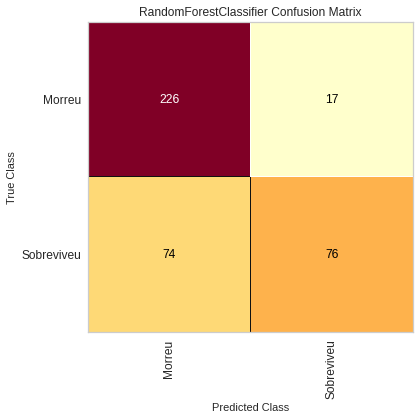

In [63]:
mapping = {0: "Morreu", 1: "Sobreviveu"}
fig, ax = plt.subplots(figsize=(6, 6))
cm_viz = ConfusionMatrix(
    rf5,
    classes=["Morreu", "Sobreviveu"],
    label_encoder=mapping,
)
cm_viz.score(X_test, y_test)
cm_viz.poof()

### Curva ROC

Executamos também o gráfico ROC (Características operacionais do receptor), que serve para avaliar os nossos classificadores

In [68]:
y_pred = rf5.predict(X_test)
roc_auc_score(y_test, y_pred)

0.7183539094650206

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  "X does not have valid feature names, but"


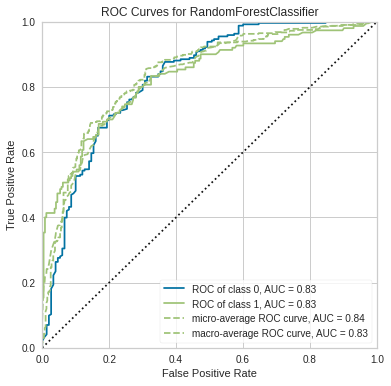

In [65]:
fig, ax = plt.subplots(figsize=(6, 6))
roc_viz = ROCAUC(rf5)
roc_viz.fit(X_train, y_train)
roc_viz.score(X_test, y_test)
roc_viz.poof()

Aqui podemos ver a taxa dos positivos em relação à taxa dos falso-positivos. Aqui no gráfico nós percebemos que o valor está próximo a 1(um), sendo assim conseguimos garantir que nosso modelo está adequado.

### Curva de aprendizado

Utilizamos a curva de aprendizado para verificarmos se os dados de treinamento são suficientes, reaparemos que na curva de aprendizado mostra que, à medida que adicionamos mais amostrar para treinamento, nossas pontuções de validação cruzada (testes) parecem melhorar.

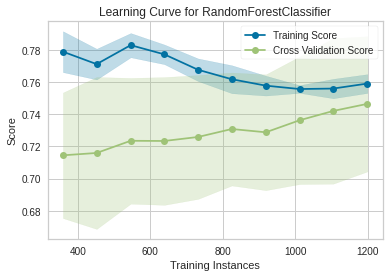

In [67]:
import numpy as np
fig, ax = plt.subplots(figsize=(6, 4))
cv = StratifiedKFold(12)
sizes = np.linspace(0.3, 1.0, 10)
lc_viz = LearningCurve(
    rf5,
    cv=cv,
    train_sizes=sizes,
    scoring="f1_weighted",
    n_jobs=4,
    ax=ax,
)
lc_viz.fit(X, y)
lc_viz.poof()

### Implantação do modelo

Nós decidimos utilizar o nosso modelo no site: https://mdba-titanic-app.herokuapp.com/

Este site foi criado utilizando Flask e usa o modelo que iremos exportar com a biblioteca pickle.

In [80]:
import pickle

def dumpModel(model, filename):
  pickle.dump(model, open(filename, 'wb'))

In [79]:
X_test.columns

Index(['pclass', 'age', 'sibsp', 'parch', 'fare', 'sex_male', 'embarked_Q',
       'embarked_S'],
      dtype='object')

In [81]:
filename = 'titanic_model_randomforestclassifier.sav'

dumpModel(rf5, filename) # Aqui exportamos o nosso modelo para utilizar no Flask

### Teste do arquivo exportado

Fizemos um teste para garantir que está tudo correto com a execução do roc_auc_score que retornou 

In [221]:
loaded_model = pickle.load(open(filename, 'rb'))
y_pred = loaded_model.predict(X_test)

#X_test.iloc[[0, 1, 18, 19]]
#df = pd.DataFrame({'pclass': 	3, 'age': 30, 'sibsp': 1, 'parch': 1, 'fare': 30, 'sex_male': 1, 'embarked_Q': 0, 'embarked_S': 1}, index=[1])

result = roc_auc_score(y_test, y_pred)

print(
    f'Pontuação do AUC: ' + \
    f'{result*100:.2f}'
)


Pontuação do AUC: 71.84
